# Title: Color Calibration process for WGRF faba bean images
### Author: Harpreet Kaur Bargota
### Date : Jan 2025

#hkb
#__author__="harpreet kaur bargota"
#__email__="harpreet.bargota@agr.gc.ca"
#__Project__="Faba bean Feature extraction pipeline (Step3)"
#References:
#https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2lab
#https://matplotlib.org/stable/gallery/color/named_colors.html#css-colors
#https://docs.scipy.org/doc/scipy/reference/spatial.distance.html

"""
Step 3: Dominant Seed Color Extraction with Color Calibration

This script processes image Faba-Seed-CC-Vf257-1-1.JPG from a folder to calculate CCM from reference RGB values (from colorcard) to measured RGB values. It also validates the calculated CCM for testing on colored boxes from colorcard. 

Key steps:
1. Color Calibration:
   - Crops the 24-patch color card from image
   - Measures average RGB values of patches and compares them to reference RGBs.
   - Computes a Color Correction Matrix (CCM) using linear regression.
   - prints the df with referencs and measured RGB values, ccm matrix, plots the linear regression graphs for each channel  

2. Dominant Color Extraction:
   - For each bounding box, extracts the region of interest (ROI) from the corrected image.
   - Finds the most frequent RGB color, excluding blue shades.
   - Converts the RGB to the closest CSS4 color name using the CIE Lab color space.

3. Validation from standard color box from color card

   - Use the bounding box coord from known color box from color card to get the RGB value and Color name (from CS4 color name) using the same CCM calculated by using Faba-Seed-CC-Vf257-1-1.JPG
   - Plots the image with green colored bounding box for that particular colorcard for visualization purposes

### Import the required libraries

In [1]:
#import the required libraries
import os
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from skimage.color import rgb2lab, deltaE_cie76
from collections import Counter
from scipy.spatial.distance import cdist
from matplotlib.colors import CSS4_COLORS


### Define the functions- the same functions as used in Step3_color.py

In [2]:
# ---------------------- CONFIG ----------------------

COLOR_CARD_CROP = (0, 1800, 0, 2800)

REFERENCE_RGBS = np.array([
    [113, 81, 68], [200, 148, 131], [88, 122, 159], [88, 108, 67],
    [128, 129, 178], [87, 192, 175], [227, 125, 51], [66, 90, 172],
    [198, 82, 99], [91, 60, 108], [158, 191, 68], [231, 163, 48],
    [44, 62, 147], [62, 149, 77], [180, 48, 57], [240, 201, 46],
    [194, 85, 155], [0, 137, 173], [236, 235, 236], [203, 206, 208],
    [161, 164, 168], [119, 121, 124], [82, 83, 89], [50, 50, 51]
], dtype=np.float32)

# Precompute CSS4 color names
_css4_names = list(CSS4_COLORS.keys())
_css4_rgb = np.array([tuple(int(h.lstrip('#')[i:i+2], 16) for i in (0,2,4)) 
                      for h in CSS4_COLORS.values()]) / 255.0
_css4_lab = rgb2lab(_css4_rgb.reshape(-1,1,3)).reshape(-1,3)

# ---------------------- HELPERS ----------------------

def find_calibration_image(folder: Path):
    patterns = ["calib", "calibration", "color", "colorcard", "color_card"]
    exts = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp"}
    candidates = [p for p in folder.iterdir() if p.suffix.lower() in exts and p.is_file()]
    for p in candidates:
        if any(pat in p.name.lower() for pat in patterns):
            return p
    return candidates[0] if candidates else None

def crop_color_card(image):
    y0, y1, x0, x1 = COLOR_CARD_CROP
    H, W = image.shape[:2]
    y0 = max(0, min(y0,H-1)); y1 = max(0, min(y1,H))
    x0 = max(0, min(x0,W-1)); x1 = max(0, min(x1,W))
    return image[y0:y1, x0:x1]

def measure_color_card_patches(image, rows=4, cols=6):
    h, w, _ = image.shape
    patch_h, patch_w = h//rows, w//cols
    measured = []
    for r in range(rows):
        for c in range(cols):
            y0, y1 = r*patch_h, (r+1)*patch_h
            x0, x1 = c*patch_w, (c+1)*patch_w
            patch = image[y0:y1, x0:x1]
            avg_rgb = np.mean(patch.reshape(-1,3), axis=0)
            measured.append(avg_rgb)
    return np.array(measured, dtype=np.float32)

def compute_ccm(measured, reference):
    reg = LinearRegression(fit_intercept=False)
    reg.fit(measured, reference)
    return reg.coef_

def apply_ccm(image, ccm):
    h, w, _ = image.shape
    flat = image.reshape(-1,3)
    corrected = np.dot(flat, ccm.T)
    corrected = np.clip(corrected,0,255)
    return corrected.reshape(h,w,3).astype(np.uint8)

def compute_deltaE(measured, reference):
    measured_lab = rgb2lab(measured[np.newaxis,:,:]/255.0)
    reference_lab = rgb2lab(reference[np.newaxis,:,:]/255.0)
    deltaE = deltaE_cie76(measured_lab, reference_lab)
    return np.mean(deltaE), np.max(deltaE)

def find_images(folder: Path):
    exts = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp"}
    return [p for p in folder.iterdir() if p.suffix.lower() in exts and p.is_file()]

def rgb_to_css4_color_name(rgb):
    rgb_norm = np.array(rgb, dtype=np.float64)/255.0
    lab = rgb2lab(np.array([[rgb_norm]]))[0][0]
    d = cdist([lab], _css4_lab)[0]
    idx = int(np.argmin(d))
    return _css4_names[idx]

def get_dominant_color_excluding_blue(img, x, y, w, h):
    H, W, _ = img.shape
    x0, y0 = max(0,int(round(x))), max(0,int(round(y)))
    x1, y1 = min(W,int(round(x+w))), min(H,int(round(y+h)))
    roi = img[y0:y1,x0:x1]
    flat = roi.reshape(-1,3)
    counts = Counter(map(tuple, flat))
    for color,_ in counts.most_common():
        name = rgb_to_css4_color_name(color)
        if "blue" not in name.lower() and name.lower() not in ["dodgerblue","cornflowerblue"]:
            return color
    return counts.most_common(1)[0][0]

def find_first_csv(folder: Path):
    csvs = [p for p in folder.iterdir() if p.suffix.lower()==".csv" and p.is_file()]
    return csvs[0] if csvs else None




### Color Calibration Process: 

#### Read the image Faba-Seed-CC_Vf257-1-1.JPG and plot it

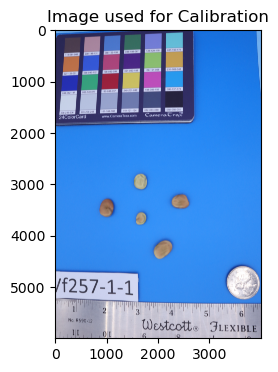

In [3]:
# Set the path to your calibration image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf257-1-1.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8,4))
plt.imshow(img_rgb)
plt.title("Image used for Calibration")
plt.axis("on")
plt.show()

#### Crop the colorcard and plot it

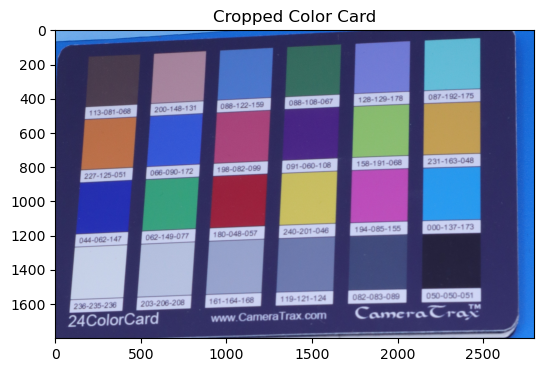

In [4]:
# Set the path to your calibration image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf257-1-1.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
card = crop_color_card(img_rgb)
plt.figure(figsize=(8,4))
plt.imshow(card)
plt.title("Cropped Color Card")
plt.axis("on")
plt.show()


#### Measures the 24 patches 

In [5]:
# Step 2: Measure Patches and Compute CCM
measured_rgb = measure_color_card_patches(card)
print (measured_rgb)
if measured_rgb.shape[0] != 24:
    raise ValueError("Expected 24 patches. Check crop or card visibility.")

[[ 63.32662   70.48434  111.37263 ]
 [104.29642   97.7764   138.66977 ]
 [ 68.24297   95.84108  158.9888  ]
 [ 76.01142   99.56144  131.5688  ]
 [ 99.392685 124.33965  173.82657 ]
 [ 62.160057  97.75125  152.20044 ]
 [130.15445   99.31435  109.055565]
 [ 75.35777   93.29165  167.82832 ]
 [137.76718   82.67743  130.17409 ]
 [111.70936  102.13892  134.49693 ]
 [136.29362  142.1076   133.64847 ]
 [ 79.33088   96.37611  136.47289 ]
 [ 77.57392   82.82931  159.90543 ]
 [ 93.29105  133.80002  144.26454 ]
 [139.86307   99.35606  123.93903 ]
 [140.9628   124.610016 143.09459 ]
 [ 96.371376  95.83442  158.81659 ]
 [ 51.69952   83.813194 148.27597 ]
 [120.152985 123.01832  161.76959 ]
 [117.93963  121.424675 162.91925 ]
 [109.04219  113.00571  158.84763 ]
 [ 94.01972   97.40715  144.89844 ]
 [ 86.44531   87.5483   130.92302 ]
 [ 65.93894   81.85782  140.19006 ]]


#### Computes CCM using the reference RGB and MEasured RGB values; plots the linear regression graphs

Computed Color Correction Matrix (CCM):
 [[ 1.9229723  -0.29830503 -0.14728983]
 [-0.5204266   2.2728734  -0.37359908]
 [-0.3096156  -0.5856135   1.467306  ]]
Mean DeltaE: 40.40
Max DeltaE: 95.32

--- Reference vs Measured RGB ---
    R_reference  G_reference  B_reference  R_measured  G_measured  B_measured
0         113.0         81.0         68.0   63.326618   70.484337  111.372627
1         200.0        148.0        131.0  104.296417   97.776398  138.669769
2          88.0        122.0        159.0   68.242973   95.841080  158.988800
3          88.0        108.0         67.0   76.011421   99.561440  131.568802
4         128.0        129.0        178.0   99.392685  124.339653  173.826569
5          87.0        192.0        175.0   62.160057   97.751251  152.200439
6         227.0        125.0         51.0  130.154449   99.314346  109.055565
7          66.0         90.0        172.0   75.357773   93.291649  167.828323
8         198.0         82.0         99.0  137.767181   82.677429  

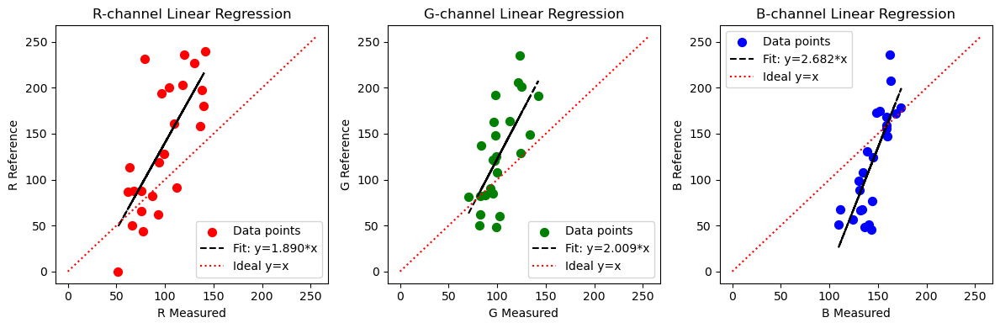

In [6]:
# Create DataFrame with reference and measured RGB

ccm = compute_ccm(measured_rgb, REFERENCE_RGBS)
print("Computed Color Correction Matrix (CCM):\n", ccm)

#Apply CCM to the Color Card
calibrated_card = apply_ccm(card, ccm)

#Compute Statistics

mean_deltaE, max_deltaE = compute_deltaE(measured_rgb, REFERENCE_RGBS)
print(f"Mean DeltaE: {mean_deltaE:.2f}")
print(f"Max DeltaE: {max_deltaE:.2f}")

df = pd.DataFrame({
    "R_reference": REFERENCE_RGBS[:,0],
    "G_reference": REFERENCE_RGBS[:,1],
    "B_reference": REFERENCE_RGBS[:,2],
    "R_measured": measured_rgb[:,0],
    "G_measured": measured_rgb[:,1],
    "B_measured": measured_rgb[:,2]
})

print("\n--- Reference vs Measured RGB ---")
print(df)

# -----------------------------
#Print regression coefficients (CCM)
print("\n--- Linear Regression Coefficients (CCM) ---")

channels = ["R", "G", "B"]
for i, ch in enumerate(channels):
    print(f"{ch}-channel coefficients: {ccm[i]}")  # row i of CCM corresponds to predicting this channel

#Plot regression graphs with fitted line

plt.figure(figsize=(12,4))
for i, ch in enumerate(channels):
    plt.subplot(1,3,i+1)
    
    X = df[f"{ch}_measured"].values.reshape(-1,1)  # predictor
    y = df[f"{ch}_reference"].values                # true value
    
    # Fit Linear Regression line
    reg = LinearRegression()
    reg.fit(X, y)
    y_pred_line = reg.predict(X)
    
    # Scatter measured vs reference
    plt.scatter(X, y, color=ch.lower(), s=50, label="Data points")
    
    # Plot fitted regression line
    plt.plot(X, y_pred_line, 'k--', label=f"Fit: y={reg.coef_[0]:.3f}*x")
    
    # Ideal y=x line
    plt.plot([0,255],[0,255],'r:', label="Ideal y=x")
    
    plt.xlabel(f"{ch} Measured")
    plt.ylabel(f"{ch} Reference")
    plt.title(f"{ch}-channel Linear Regression")
    plt.legend()
    
plt.tight_layout()
plt.show()


### Validation of the corrected image using the applied CCM shows that the extracted color names (from CSS4) match those observed by the human eye.  

##### For validation, the calculated Color Correction Matrix (CCM) was applied to the image Faba-Seed-CC-Vf1-1-2.JPG, and the RGB values along with corresponding CSS4 color names were extracted using the procedure outlined in Step3_color.py for known color card boxes. Initially, Step1_SAM.py generated metadata.csv and binary masks for each object in the image, enabling precise identification of individual regions. For each color box on the color card, the corresponding mask was selected, and its bounding box coordinates were obtained from metadata.csv. These coordinates were then used to extract the RGB values and determine the CSS4 color name for the specific color box. To visually confirm the extraction process, the region of interest was highlighted by plotting a green bounding box around the color box in the image. This approach ensures that the color identified programmatically matches the color observed by the human eye, providing both quantitative (RGB values) and qualitative (color name) validation of the CCM application. By combining mask-based segmentation with standardized color naming, this method enables precise verification of color accuracy and consistency across corrected images.

#### Image1: Faba-Seed-CC_Vf1-1-2.JPG

RGB: [[137, 79, 45]]
Color_name: ['sienna']


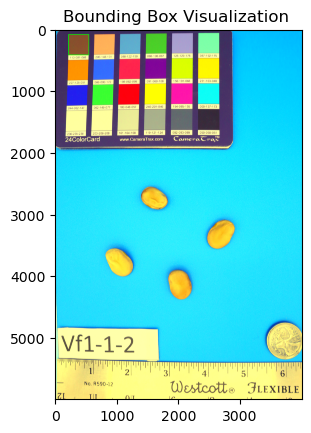

In [7]:
# Validation
# Load image
img_bgr = cv2.imread("../../Data/Faba-Seed-CC_Vf1-1-2.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Apply color correction
corrected_rgb = apply_ccm(img_rgb, ccm)

# -------------------------------
# Bounding box (x, y, w, h)--first bounding box- as 23.png in output_SAM and id= 23 in metadata.csv 
# -------------------------------
x = 220
y = 88
w = 328
h = 331
# bbox_x0,bbox_y0,bbox_w,bbox_h,
#220.0,88.0,328.0,331.0,
# -------------------------------
# Draw green bounding box
# -------------------------------
img_with_box = corrected_rgb.copy()
cv2.rectangle(
    img_with_box,
    (x, y),                 # top-left
    (x + w, y + h),         # bottom-right
    (0, 255, 0),            # green (RGB)
    thickness=10
)

# -------------------------------
# Dominant color extraction
# -------------------------------
rgb_values, color_names = [], []

dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
rgb_values.append([int(c) for c in dom])
color_names.append(rgb_to_css4_color_name(dom))

print("RGB:", rgb_values)
print("Color_name:", color_names)

plt.figure()
plt.imshow(img_with_box)
plt.axis("on")
plt.title("Bounding Box Visualization ")
plt.show()

Since, the ccm was applied to a new image and the color name and RGB was extracted from it and the results showed that the extracted color-sienna colored box (marked with green bounding box) was at top left part of the color card. 
We further tested on different bounding box coords taken from the same metdadata file.

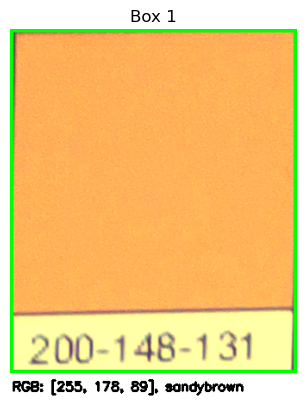

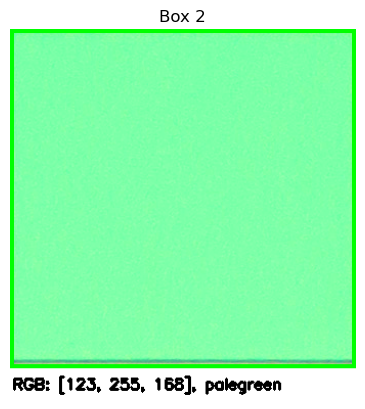

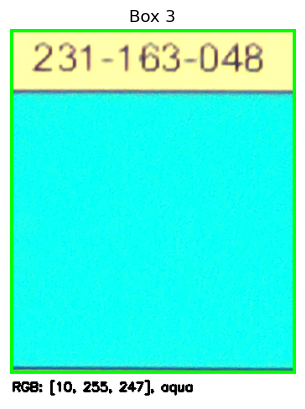

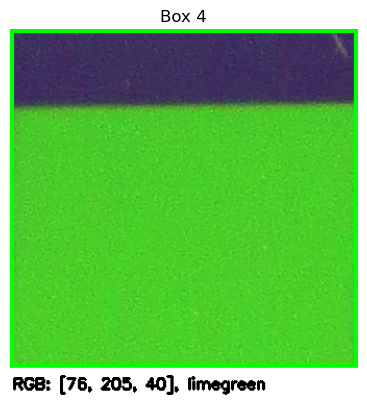

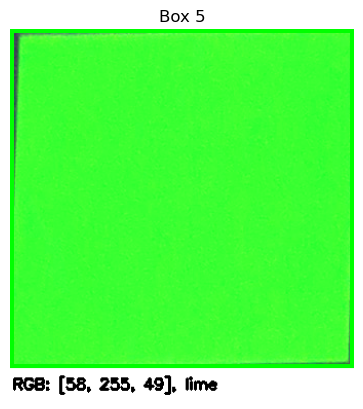

...

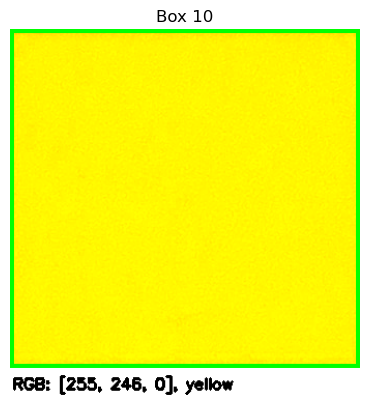

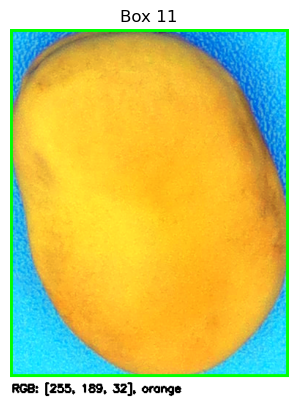

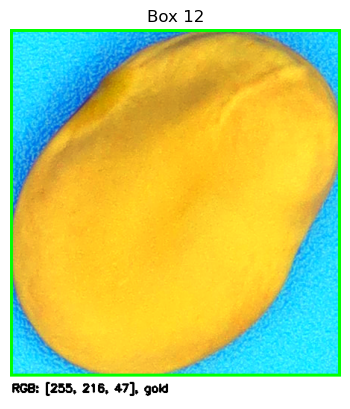

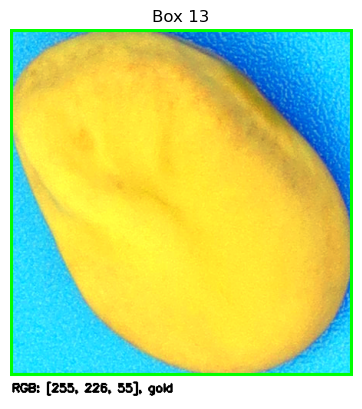

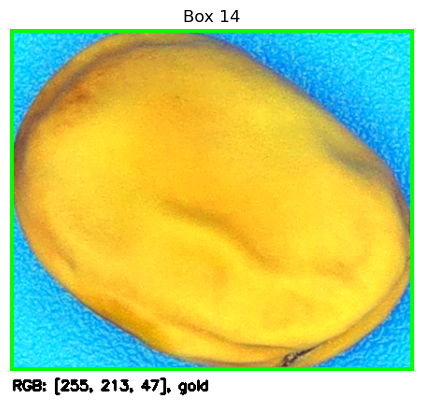

RGB values: [[255, 178, 89], [123, 255, 168], [10, 255, 247], [76, 205, 40], [58, 255, 49], [168, 160, 208], [255, 149, 0], [137, 79, 45], [255, 0, 13], [255, 246, 0], [255, 189, 32], [255, 216, 47], [255, 226, 55], [255, 213, 47]]
Color names: ['sandybrown', 'palegreen', 'aqua', 'limegreen', 'lime', 'thistle', 'darkorange', 'sienna', 'red', 'yellow', 'orange', 'gold', 'gold', 'gold']


In [8]:
bboxes = [
    [632.0, 83.0, 333.0, 399.0],       
    [2321.0, 65.0, 338.0, 332.0],      
    [2318.0, 808.0, 341.0, 412.0],     
    [1472.0, 0.75, 334.0, 325.0],      
    [606.0, 901.0, 335.0, 330.0],      
    [1884.0, 0.807, 342.0, 411.0],     
    [205.0, 500.0, 333.0, 328.0],      
    [220.0, 88.0, 328.0, 331.0],       
    [1027.0, 895.0, 340.0, 327.0],     
    [2320.0, 473.0, 338.0, 327.0],
    [1834.0,3908.0,381.0,476.0],
    [2465.0,3095.0,444.0,466.0],
    [818.0,3558.0,447.0,453.0],
    [1393.0,2557.0,432.0,366.0]
]

rgb_values = []
color_names = []

for i, (x, y, w, h) in enumerate(bboxes):
    try:
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Crop the box region only
        crop_img = corrected_rgb[y:y+h, x:x+w].copy()

        # Draw bounding box on cropped image
        cv2.rectangle(
            crop_img,
            (0, 0),         # top-left of cropped
            (w-1, h-1),     # bottom-right of cropped
            (0, 255, 0),    # green
            thickness=5
        )

        # Get dominant color (with error handling)
        dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
        rgb_val = [int(c) for c in dom]
        color_name = rgb_to_css4_color_name(dom)

    except Exception as e:
        print(f"Warning for box {i}: {e}")
        rgb_val = [0, 0, 0]
        color_name = "unknown"

    # Save values
    rgb_values.append(rgb_val)
    color_names.append(color_name)

    # Prepare annotation text
    text = f"RGB: {rgb_val}, {color_name}"

    # Extend canvas below the box to put the text
    annotated_img = cv2.copyMakeBorder(
        crop_img,
        0, 30, 0, 0,               # add 30px at bottom
        cv2.BORDER_CONSTANT,
        value=[255, 255, 255]       # white background
    )

    # Write RGB and color name below the box
    cv2.putText(
        annotated_img,
        text,
        (2, h + 20),               # position in the extended area
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,                        # font scale
        (0, 0, 0),                  # black text
        2
    )

    # Plot the cropped image with annotation
    plt.figure()
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title(f"Box {i+1}")
    plt.show()

# Optional: print all extracted colors
print("RGB values:", rgb_values)
print("Color names:", color_names)


Result: After applying the calculated CCM to new image Faba-bean-Seed-CC_Vf1-1-2, we extracted the color for the standard colored box in the color card as well as for the seeds. The visulaizations show that the color name (as extracted using Step3_color.py from pipeline) is aligning with the color observed from human eye.

#### Image2: Faba-Seed-CC_Vf9-1-1.JPG with black colored seeds

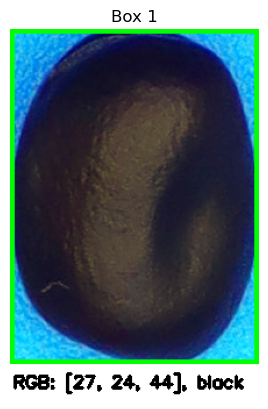

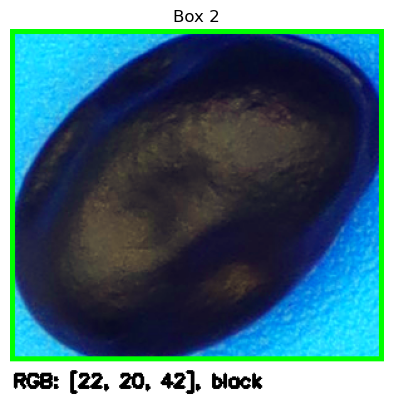

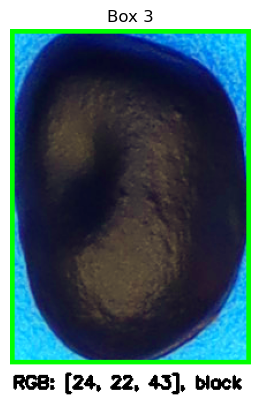

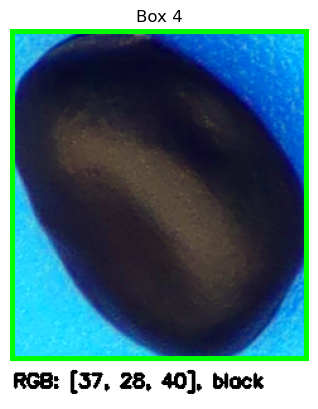

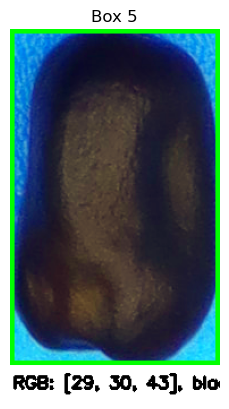

...

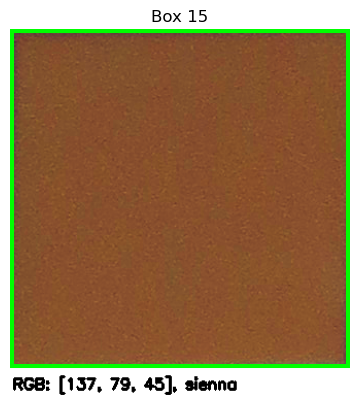

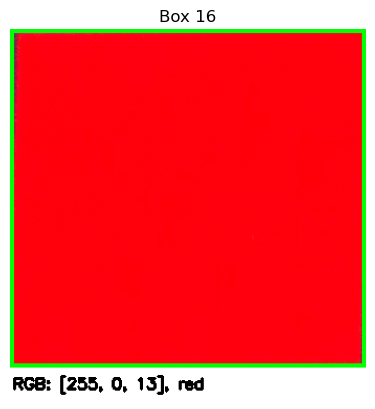

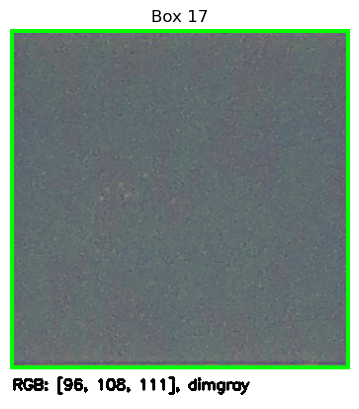

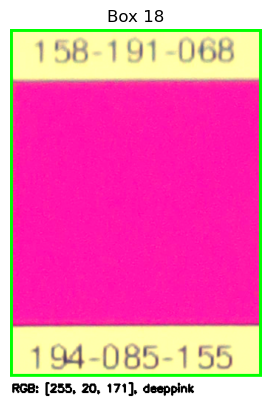

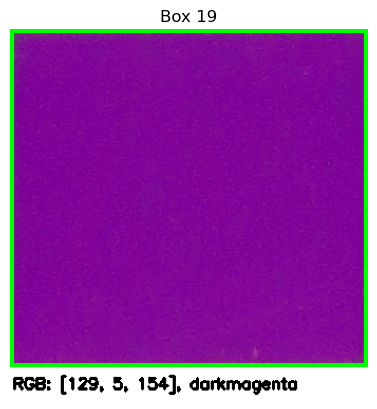

RGB values: [[27, 24, 44], [22, 20, 42], [24, 22, 43], [37, 28, 40], [29, 30, 43], [9, 15, 42], [255, 176, 89], [10, 12, 36], [24, 21, 38], [53, 44, 60], [10, 255, 247], [58, 255, 49], [123, 255, 168], [219, 255, 0], [137, 79, 45], [255, 0, 13], [96, 108, 111], [255, 20, 171], [129, 5, 154]]
Color names: ['black', 'black', 'black', 'black', 'black', 'black', 'sandybrown', 'black', 'black', 'black', 'aqua', 'lime', 'palegreen', 'yellow', 'sienna', 'red', 'dimgray', 'deeppink', 'darkmagenta']


In [9]:
# Load image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf9-1-1.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Apply color correction
corrected_rgb = apply_ccm(img_rgb, ccm)
#Defining the bounding box cords from metadata file
bboxes= [
    [2411.0, 3298.0, 214.0, 288.0],
    [722.0, 2846.0, 298.0, 265.0],
    [1861.0, 3542.0, 209.0, 291.0],
    [1017.0, 3861.0, 237.0, 263.0],
    [2348.0, 3991.0, 185.0, 297.0],
    [1676.0, 2913.0, 293.0, 213.0],
    [636.0, 98.0, 334.0, 331.0],
    [1821.0, 4257.0, 252.0, 263.0],
    [606.0, 3360.0, 203.0, 284.0],
    [2325.0, 1316.0, 345.0, 342.0],
    [2326.0, 829.0, 341.0, 402.0],
    [610.0, 920.0, 337.0, 328.0],
    [2328.0, 79.0, 337.0, 403.0],
    [1896.0, 492.0, 339.0, 322.0],
    [223.0, 104.0, 330.0, 329.0],
    [1032.0, 912.0, 340.0, 323.0],
    [1886.0, 1312.0, 344.0, 345.0],
    [1891.0, 829.0, 341.0, 471.0],
    [1468.0, 498.0, 339.0, 320.0],
]

rgb_values = []
color_names = []

for i, (x, y, w, h) in enumerate(bboxes):
    try:
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Crop the box region only
        crop_img = corrected_rgb[y:y+h, x:x+w].copy()

        # Draw bounding box on cropped image
        cv2.rectangle(
            crop_img,
            (0, 0),         # top-left of cropped
            (w-1, h-1),     # bottom-right of cropped
            (0, 255, 0),    # green
            thickness=5
        )

        # Get dominant color (with error handling)
        dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
        rgb_val = [int(c) for c in dom]
        color_name = rgb_to_css4_color_name(dom)

    except Exception as e:
        print(f"Warning for box {i}: {e}")
        rgb_val = [0, 0, 0]
        color_name = "unknown"

    # Save values
    rgb_values.append(rgb_val)
    color_names.append(color_name)

    # Prepare annotation text
    text = f"RGB: {rgb_val}, {color_name}"

    # Extend canvas below the box to put the text
    annotated_img = cv2.copyMakeBorder(
        crop_img,
        0, 30, 0, 0,               # add 30px at bottom
        cv2.BORDER_CONSTANT,
        value=[255, 255, 255]       # white background
    )

    # Write RGB and color name below the box
    cv2.putText(
        annotated_img,
        text,
        (2, h + 20),               # position in the extended area
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,                        # font scale
        (0, 0, 0),                  # black text
        2
    )

    # Plot the cropped image with annotation
    plt.figure()
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title(f"Box {i+1}")
    plt.show()

# Optional: print all extracted colors
print("RGB values:", rgb_values)
print("Color names:", color_names)


#### Image3: Faba-Seed-CC_Vf494-1-1.JPG with green colored seeds

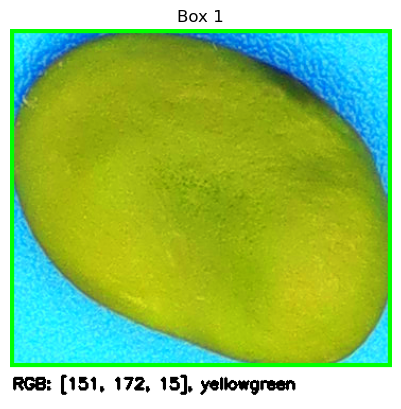

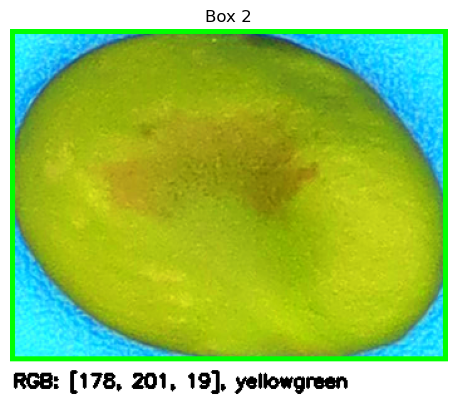

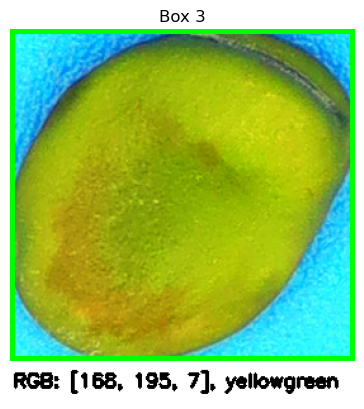

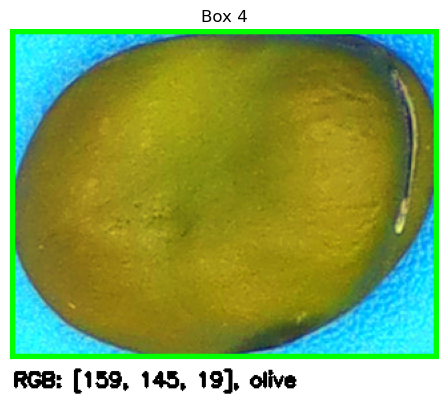

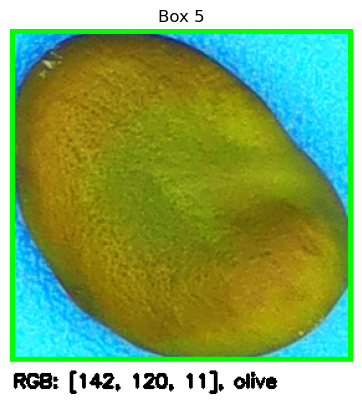

...

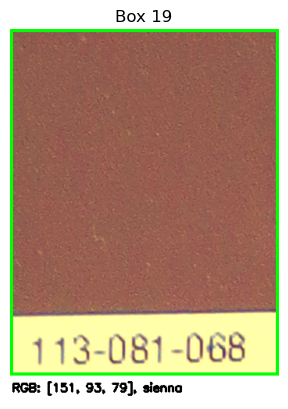

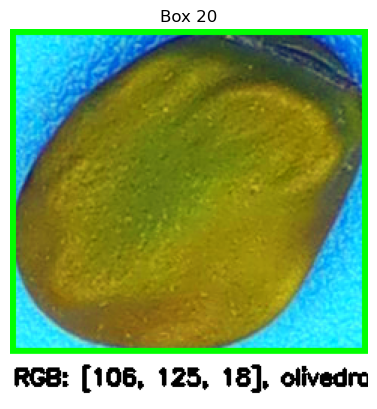

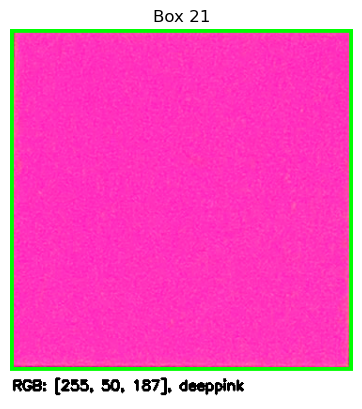

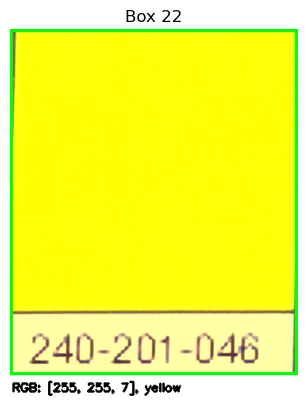

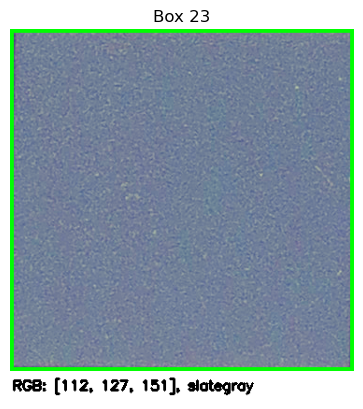

RGB values: [[151, 172, 15], [178, 201, 19], [168, 195, 7], [159, 145, 19], [142, 120, 11], [255, 192, 123], [163, 255, 182], [172, 182, 21], [80, 227, 87], [78, 58, 159], [44, 255, 245], [76, 53, 78], [255, 255, 0], [255, 166, 5], [255, 51, 118], [232, 255, 46], [70, 255, 106], [255, 0, 43], [151, 93, 79], [106, 125, 18], [255, 50, 187], [255, 255, 7], [112, 127, 151]]
Color names: ['yellowgreen', 'yellowgreen', 'yellowgreen', 'olive', 'olive', 'sandybrown', 'lightgreen', 'yellowgreen', 'limegreen', 'rebeccapurple', 'aqua', 'dimgray', 'yellow', 'orange', 'deeppink', 'yellow', 'springgreen', 'red', 'sienna', 'olivedrab', 'deeppink', 'yellow', 'slategray']


In [10]:
# Load image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf494-1-1.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Apply color correction
corrected_rgb = apply_ccm(img_rgb, ccm)
#Defining the bounding box cords from metadata file

bboxes = [
    [2449.0, 3738.0, 360.0, 319.0],
    [2187.0, 2720.0, 349.0, 265.0],
    [1919.0, 3381.0, 272.0, 262.0],
    [1429.0, 3035.0, 322.0, 248.0],
    [2853.0, 3099.0, 276.0, 268.0],
    [609.0, 122.0, 351.0, 454.0],
    [2411.0, 98.0, 371.0, 371.0],
    [942.0, 3695.0, 335.0, 262.0],
    [1499.0, 109.0, 361.0, 367.0],
    [161.0, 1033.0, 341.0, 356.0],
    [2392.0, 1017.0, 369.0, 366.0],
    [2382.0, 1474.0, 370.0, 372.0],
    [2402.0, 560.0, 368.0, 361.0],
    [169.0, 585.0, 342.0, 359.0],
    [1041.0, 570.0, 355.0, 362.0],
    [1943.0, 562.0, 364.0, 357.0],
    [592.0, 1027.0, 348.0, 356.0],
    [1030.0, 1021.0, 355.0, 357.0],
    [173.0, 131.0, 344.0, 444.0],
    [1446.0, 4074.0, 238.0, 216.0],
    [1933.0, 1015.0, 365.0, 364.0],
    [1476.0, 1019.0, 363.0, 437.0],
    [1921.0, 1469.0, 368.0, 366.0]
]

rgb_values = []
color_names = []

for i, (x, y, w, h) in enumerate(bboxes):
    try:
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Crop the box region only
        crop_img = corrected_rgb[y:y+h, x:x+w].copy()

        # Draw bounding box on cropped image
        cv2.rectangle(
            crop_img,
            (0, 0),         # top-left of cropped
            (w-1, h-1),     # bottom-right of cropped
            (0, 255, 0),    # green
            thickness=5
        )

        # Get dominant color (with error handling)
        dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
        rgb_val = [int(c) for c in dom]
        color_name = rgb_to_css4_color_name(dom)

    except Exception as e:
        print(f"Warning for box {i}: {e}")
        rgb_val = [0, 0, 0]
        color_name = "unknown"

    # Save values
    rgb_values.append(rgb_val)
    color_names.append(color_name)

    # Prepare annotation text
    text = f"RGB: {rgb_val}, {color_name}"

    # Extend canvas below the box to put the text
    annotated_img = cv2.copyMakeBorder(
        crop_img,
        0, 30, 0, 0,               # add 30px at bottom
        cv2.BORDER_CONSTANT,
        value=[255, 255, 255]       # white background
    )

    # Write RGB and color name below the box
    cv2.putText(
        annotated_img,
        text,
        (2, h + 20),               # position in the extended area
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,                        # font scale
        (0, 0, 0),                  # black text
        2
    )

    # Plot the cropped image with annotation
    plt.figure()
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title(f"Box {i+1}")
    plt.show()

# Optional: print all extracted colors
print("RGB values:", rgb_values)
print("Color names:", color_names)


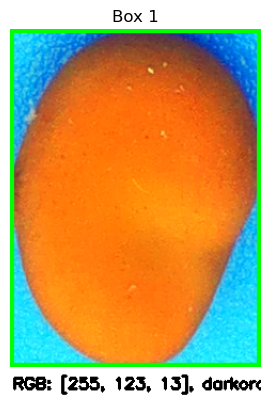

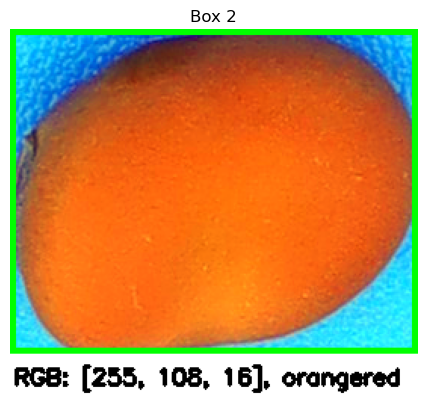

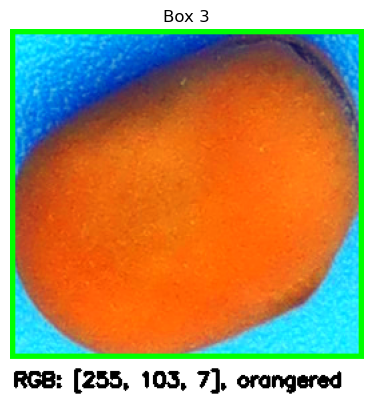

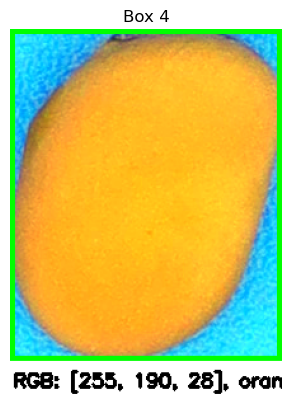

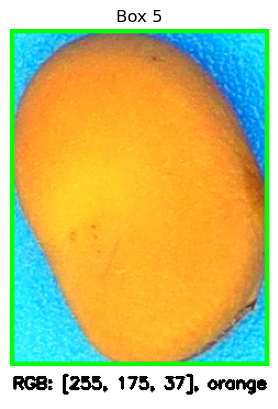

...

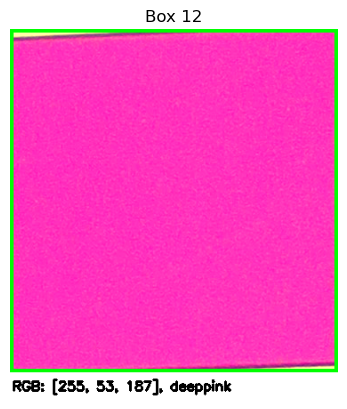

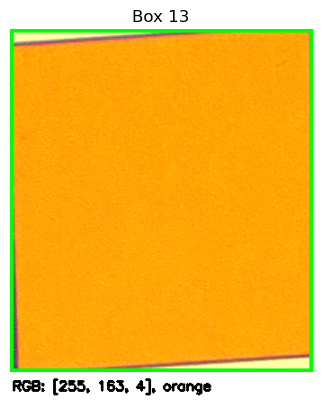

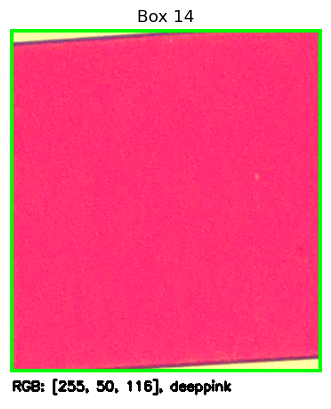

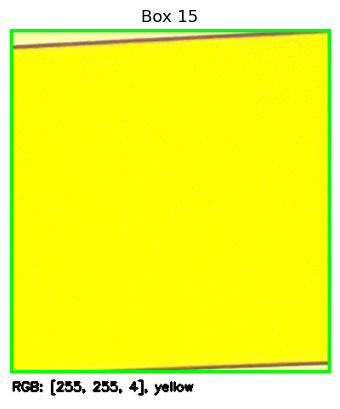

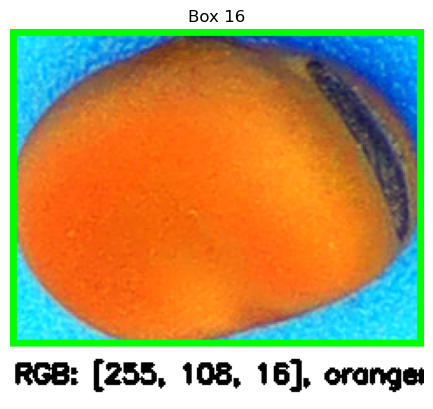

RGB values: [[255, 123, 13], [255, 108, 16], [255, 103, 7], [255, 190, 28], [255, 175, 37], [255, 122, 4], [255, 114, 17], [146, 93, 79], [161, 255, 185], [255, 190, 126], [255, 191, 43], [255, 53, 187], [255, 163, 4], [255, 50, 116], [255, 255, 4], [255, 108, 16]]
Color names: ['darkorange', 'orangered', 'orangered', 'orange', 'orange', 'darkorange', 'darkorange', 'sienna', 'lightgreen', 'sandybrown', 'goldenrod', 'deeppink', 'orange', 'deeppink', 'yellow', 'orangered']


In [11]:
# Load image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf561-2-1.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Apply color correction
corrected_rgb = apply_ccm(img_rgb, ccm)
#Defining the bounding box cords from metadata file
bboxes = [
    [1846.0, 4313.0, 235.0, 317.0],
    [2364.0, 3718.0, 270.0, 215.0],
    [2605.0, 4221.0, 265.0, 247.0],
    [2408.0, 2715.0, 214.0, 261.0],
    [1701.0, 3067.0, 236.0, 307.0],
    [2935.0, 3137.0, 300.0, 241.0],
    [1034.0, 3019.0, 222.0, 195.0],
    [44.0, 166.0, 349.0, 397.0],
    [2311.0, 0.0, 383.0, 413.0],
    [476.0, 132.0, 353.0, 465.0],
    [1788.0, 3764.0, 244.0, 274.0],
    [1839.0, 1000.0, 369.0, 386.0],
    [66.0, 639.0, 337.0, 382.0],
    [927.0, 578.0, 351.0, 387.0],
    [2312.0, 487.0, 377.0, 405.0],
    [1232.0, 3646.0, 237.0, 182.0],
]

rgb_values = []
color_names = []

for i, (x, y, w, h) in enumerate(bboxes):
    try:
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Crop the box region only
        crop_img = corrected_rgb[y:y+h, x:x+w].copy()

        # Draw bounding box on cropped image
        cv2.rectangle(
            crop_img,
            (0, 0),         # top-left of cropped
            (w-1, h-1),     # bottom-right of cropped
            (0, 255, 0),    # green
            thickness=5
        )

        # Get dominant color (with error handling)
        dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
        rgb_val = [int(c) for c in dom]
        color_name = rgb_to_css4_color_name(dom)

    except Exception as e:
        print(f"Warning for box {i}: {e}")
        rgb_val = [0, 0, 0]
        color_name = "unknown"

    # Save values
    rgb_values.append(rgb_val)
    color_names.append(color_name)

    # Prepare annotation text
    text = f"RGB: {rgb_val}, {color_name}"

    # Extend canvas below the box to put the text
    annotated_img = cv2.copyMakeBorder(
        crop_img,
        0, 30, 0, 0,               # add 30px at bottom
        cv2.BORDER_CONSTANT,
        value=[255, 255, 255]       # white background
    )

    # Write RGB and color name below the box
    cv2.putText(
        annotated_img,
        text,
        (2, h + 20),               # position in the extended area
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,                        # font scale
        (0, 0, 0),                  # black text
        2
    )

    # Plot the cropped image with annotation
    plt.figure()
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title(f"Box {i+1}")
    plt.show()

# Optional: print all extracted colors
print("RGB values:", rgb_values)
print("Color names:", color_names)


## Groundtruth data Validation:

Groundtruth data also shows similar color of seeds (as percieved by human eye) for these images. For example, for image Faba-Seed-CC_V9-1-1.JPG, black colored seeds have been reported and in image Faba-Seed-CC_Vf494-1-1.JPG, green colored seeds have been observed by human eyes. Thus, The color extracted by the Python script from the corrected image, after applying the CCM, corresponds to the color perceived visually by a human, with both represented using CSS4 standardized color names.

## Methodology for extracting the most dominant RGB value and the corresponding Color name from seeds

#### Perceptual Color Naming Using CSS4 Reference Colors
##### Function "rgb_to_css4_color_name":
The function 'rgb_to_css4_color_name' implements perceptual color naming by mapping an input RGB color to the closest CSS4 color using the CIELAB color space. The input color, provided in 8-bit sRGB format 
[
0
,
255
]
[0,255], is first normalized to the 
[
0
,
1
]
[0,1] range to meet the requirements of the RGB-to-LAB color conversion. The normalized RGB values are then converted to CIELAB space, which is designed to be perceptually uniform and better aligned with human color vision than RGB.

To identify the closest named color, the LAB coordinates of the input color are compared against precomputed LAB values of all CSS4 colors. A Euclidean distance metric is used to quantify perceptual dissimilarity between colors, where smaller distances indicate higher visual similarity. The CSS4 color with the minimum distance is selected as the closest perceptual match, and its corresponding color name is returned.

This LAB-based matching approach avoids the non-linearities and perceptual inconsistencies of direct RGB comparisons and provides a robust, interpretable method for assigning human-readable color names. The method is particularly suitable for downstream tasks such as color analysis, visualization, and calibrated image processing workflows.

##### Function: "get_dominant_color_excluding_blue"

To identify the dominant color within a specified region of an image, a frequency-based approach was employed. The region of interest (ROI) was first extracted using bounding box coordinates and subsequently flattened into a one-dimensional list of RGB pixel values. The occurrence of each unique color was then counted to determine its frequency within the ROI. To provide semantic meaning to the extracted colors, RGB values were mapped to standardized CSS4 color names using a pre-defined mapping function. Colors corresponding to blue hues were intentionally excluded to focus on target colors of interest. In cases where no non-blue color was sufficiently dominant, the most frequent color within the ROI was selected as the representative color. This methodology provides an effective balance between computational efficiency and human-interpretable color representation, enabling automated systems to describe visual features in a manner consistent with human perception.

In [12]:
# Create DataFrame with reference and measured RGB
# Set the path to your calibration image
img_bgr = cv2.imread(r"../../Data/Faba-Seed-CC_Vf1-1-2.JPG")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
card = crop_color_card(img_rgb)
ccm = compute_ccm(measured_rgb, REFERENCE_RGBS)
print("Computed Color Correction Matrix (CCM):\n", ccm)

#Apply CCM to the Color Card
corrected_rgb = apply_ccm(img_rgb, ccm)
x = 2465
y = 3095
w = 444
h = 466

img_with_box = corrected_rgb.copy()
cv2.rectangle(
    img_with_box,
    (x, y),                 # top-left
    (x + w, y + h),         # bottom-right
    (0, 255, 0),            # green (RGB)
    thickness=10
)

rgb_values, color_names = [], []

def rgb_to_css4_color_name(rgb):
    rgb_norm = np.array(rgb, dtype=np.float64)/255.0
    print ("rgb_norm:", rgb_norm)
    lab = rgb2lab(np.array([[rgb_norm]]))[0][0]
    print ("lab:", lab)
    d = cdist([lab], _css4_lab)[0]
    print ("d:",d)
    idx = int(np.argmin(d))
    print ("idx:", idx)
    return _css4_names[idx]

def get_dominant_color_excluding_blue(img, x, y, w, h):
    H, W, _ = img.shape
    x0, y0 = max(0,int(round(x))), max(0,int(round(y)))
    x1, y1 = min(W,int(round(x+w))), min(H,int(round(y+h)))
    roi = img[y0:y1,x0:x1]
    flat = roi.reshape(-1,3)
    counts = Counter(map(tuple, flat))
    # print ("counts:", counts)
    for color,_ in counts.most_common():
        name = rgb_to_css4_color_name(color)
        print (name)
        if "blue" not in name.lower() and name.lower() not in ["dodgerblue","cornflowerblue"]:
            return color
    return counts.most_common(1)[0][0]

dom = get_dominant_color_excluding_blue(corrected_rgb, x, y, w, h)
print (dom)
rgb_values.append([int(c) for c in dom])
color_names.append(rgb_to_css4_color_name(dom))

print("RGB:", rgb_values)
print("Color_name:", color_names)



Computed Color Correction Matrix (CCM):
 [[ 1.9229723  -0.29830503 -0.14728983]
 [-0.5204266   2.2728734  -0.37359908]
 [-0.3096156  -0.5856135   1.467306  ]]
rgb_norm: [1.         0.84705882 0.18431373]
lab: [87.2811519  -1.71577226 80.04711089]
d: [ 84.88508215  68.91147633 105.04259423  82.99140986  82.6177493
  68.58908336  61.52222347 118.44189847  63.48235629 211.84074492
 176.40681561  86.99795715  51.81403282  93.03482048  66.64856469
  55.00226875  60.6186124  132.2648245   66.53397019  95.14721757
 105.04259423 173.48850015  99.9719734   34.94766341  82.07004901
  76.17386035  82.07004901  43.63527359 145.69789899  69.04453741
  42.69521642 161.36380666  88.23045863  62.73525388  67.55959335
 137.3784434  101.2729145  101.2729145  101.81236301 176.03533599
 125.58994023 124.49157128  90.81696915  90.81696915 146.58473581
  86.24808449  75.50869862  69.74708886 174.81507786  80.06272595
  84.09552907   7.09671404  22.43253532  86.86461675  71.36319381
  51.0131634   86.8646167

#### Plot for dominant color extracted from image 

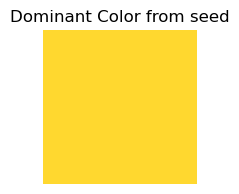

In [13]:
rgb_norm = np.array(dom)/255.0

plt.figure(figsize=(2,2))
plt.imshow([[rgb_norm]])
plt.title("Dominant Color from seed")
plt.axis('off')
plt.show()

#### Plot for dominant RGB value extracted from image 

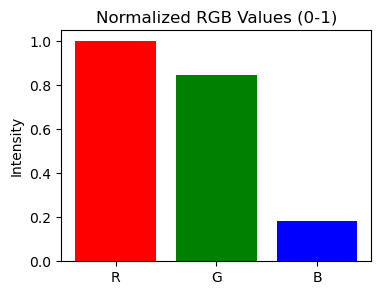

In [14]:
plt.figure(figsize=(4,3))
plt.bar(['R','G','B'], rgb_norm, color=['red','green','blue'])
plt.title("Normalized RGB Values (0-1)")
plt.ylabel("Intensity")
plt.show()


In [15]:
lab=[87.2811519,-1.71577226,80.04711089]

#### Plot for LAB values

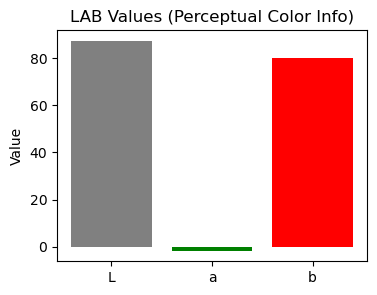

In [16]:
L, a, b = lab

plt.figure(figsize=(4,3))
plt.bar(['L', 'a', 'b'], [L, a, b], color=['gray', 'green', 'red'])
plt.title("LAB Values (Perceptual Color Info)")
plt.ylabel("Value")
plt.show()


## Conclusion:

In conclusion, the application of the Color Correction Matrix (CCM) provides an effective method for standardizing color across images, compensating for variations in lighting and acquisition conditions. Validation across multiple images containing color cards and known ground truth data demonstrated that the dominant colors extracted programmatically closely match human visual perception, with RGB values and corresponding CSS4 color names aligning with the expected reference. The combination of mask-based segmentation for precise region selection, CCM-based correction, and color name extraction ensures both quantitative accuracy and qualitative interpretability. Overall, this workflow confirms the reliability and robustness of CCM for consistent color calibration, enabling reproducible and visually accurate analyses across diverse imaging datasets.